## Review beach profile data from NANOOS

In [1]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt

In [2]:
# bring in all inventory files
import glob
datafiles = glob.glob('./dogami/*/data/*_inventory.csv')
df = pd.DataFrame(columns=['transect', 'littoralcell', 'littoralcell_fullname', 'state',
       'provider', 'projection', 'survey_count', 'date_first', 'date_last',
       'longitude', 'latitude', 'start_lon', 'start_lat', 'end_lon','end_lat'])

for ifile in datafiles:
    dfi = pd.read_csv(ifile,header=[0])
    df = pd.concat([df,dfi],sort=False,ignore_index=True)
    
df

,transect,littoralcell,littoralcell_fullname,state,provider,projection,survey_count,date_first,date_last,longitude,latitude,start_lon,start_lat,end_lon,end_lat
0,Bay1,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9601,45.5025,-123.9585,45.5023,-123.9629,45.5027
1,Bay2,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9560,45.5154,-123.9543,45.5153,-123.9591,45.5157
2,Bay3,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9542,45.5241,-123.9523,45.5240,-123.9579,45.5242
3,Bay4,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9532,45.5332,-123.9514,45.5331,-123.9565,45.5334
4,Bay5,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9519,45.5414,-123.9498,45.5415,-123.9554,45.5412
5,Bay6,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9506,45.5504,-123.9477,45.5507,-123.9550,45.5501
6,Bay7,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,51,1997-10-18,2018-12-10,-123.9513,45.5595,-123.9489,45.5597,-123.9555,45.5588
7,Neh1,Nehalem,Nehalem Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-06,-123.9414,45.6635,-123.9394,45.6634,-123.9452,45.6639
8,Neh2,Nehalem,Nehalem Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-06,-123.9405,45.6708,-123.9371,45.6705,-123.9443,45.6712
9,Neh3,Nehalem,Nehalem Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-06,-123.9404,45.6825,-123.9385,45.6825,-123.9435,45.6825


In [3]:
# Bring in the data files

import glob
datafiles = glob.glob('./dogami/*/data/*_transect_data*.csv')

df_all = pd.DataFrame(columns=['survey_number','survey_date','point_number',
                               'easting_meters','northing_meters','distance_meters',
                               'elevation_meters','measurement_approach'])
for dfile in datafiles:
    dfd = pd.read_csv(dfile,header=[0])
    dfd['transect'] = dfile.split('\\')[-1].split('_')[1]
    df_all = pd.concat([df_all,dfd],sort=False,ignore_index=True)

df_all

,survey_number,survey_date,point_number,easting_meters,northing_meters,distance_meters,elevation_meters,measurement_approach,transect
0,1,1997-10-18,1,2229807.882,209765.088,0.000,4.082,LIDAR,Bay1
1,1,1997-10-18,2,2229807.000,209765.312,0.910,4.410,LIDAR,Bay1
2,1,1997-10-18,3,2229806.250,209765.469,1.676,4.429,LIDAR,Bay1
3,1,1997-10-18,4,2229805.500,209765.609,2.438,4.447,LIDAR,Bay1
4,1,1997-10-18,5,2229804.500,209765.750,3.446,4.458,LIDAR,Bay1
...,...,...,...,...,...,...,...,...,...
429719,53,2018-12-07,221,2231521.564,225383.400,328.700,-0.245,GPS,Rck9
429720,53,2018-12-07,222,2231520.490,225383.491,329.774,-0.248,GPS,Rck9
429721,53,2018-12-07,223,2231519.398,225383.672,330.881,-0.288,GPS,Rck9
429722,53,2018-12-07,224,2231518.349,225383.918,331.956,-0.328,GPS,Rck9


In [4]:
# combine inventory with all data using transect as key
df_merge = pd.merge(df,df_all, on='transect')
df_merge.index=pd.to_datetime(df_merge['survey_date'])
df_merge['survey_date'] = pd.to_datetime(df_merge['survey_date'])
df_merge

,transect,littoralcell,littoralcell_fullname,state,provider,projection,survey_count,date_first,date_last,longitude,...,end_lon,end_lat,survey_number,survey_date,point_number,easting_meters,northing_meters,distance_meters,elevation_meters,measurement_approach
survey_date,,,,,,,,,,,,,,,,,,,,,
1997-10-18,Bay1,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9601,...,-123.9629,45.5027,1,1997-10-18,1,2229807.882,209765.088,0.000,4.082,LIDAR
1997-10-18,Bay1,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9601,...,-123.9629,45.5027,1,1997-10-18,2,2229807.000,209765.312,0.910,4.410,LIDAR
1997-10-18,Bay1,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9601,...,-123.9629,45.5027,1,1997-10-18,3,2229806.250,209765.469,1.676,4.429,LIDAR
1997-10-18,Bay1,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9601,...,-123.9629,45.5027,1,1997-10-18,4,2229805.500,209765.609,2.438,4.447,LIDAR
1997-10-18,Bay1,Bayocean,Bayocean Spit,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-10,-123.9601,...,-123.9629,45.5027,1,1997-10-18,5,2229804.500,209765.750,3.446,4.458,LIDAR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-07,Rck10,Rockaway,Rockaway,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-07,-123.9419,...,-123.9459,45.6533,53,2018-12-07,256,2231610.539,226476.872,373.137,-0.653,GPS
2018-12-07,Rck10,Rockaway,Rockaway,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-07,-123.9419,...,-123.9459,45.6533,53,2018-12-07,257,2231609.488,226476.877,374.180,-0.648,GPS
2018-12-07,Rck10,Rockaway,Rockaway,Oregon,DOGAMI-NANOOS,epsg:32126,53,1997-10-18,2018-12-07,-123.9419,...,-123.9459,45.6533,53,2018-12-07,258,2231608.370,226476.602,375.256,-0.668,GPS


In [5]:
df_merge.groupby(['littoralcell'])[['survey_date']].describe()

C:\Users\Mathew.Biddle\programs\Anaconda3\envs\IOOS\lib\site-packages\pandas\core\groupby\groupby.py:1751: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  result = self.apply(lambda x: x.describe(**kwargs))
C:\Users\Mathew.Biddle\programs\Anaconda3\envs\IOOS\lib\site-packages\pandas\core\groupby\groupby.py:1751: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  result = self.apply(lambda x: x.describe(**kwargs))
C:\Users\Mathew.Biddle\programs\Anaconda3\envs\IOOS\lib\site-packages\pandas\core\groupby\groupby.py:1751: FutureWarning: Treating datetime data as categorical rather than numeric in `

survey_date                                              
                   count unique        top  freq      first       last
littoralcell                                                          
Bayocean           91963     53 2016-01-20  2821 1997-10-18 2018-12-10
Nehalem           109398     53 2014-09-08  2478 1997-10-18 2018-12-06
Neskowin          128483     43 2002-09-15  5484 1997-10-18 2019-03-25
Rockaway           99880     53 2014-09-09  2492 1997-10-18 2018-12-07

In [6]:
df_merge.groupby(['littoralcell'])[['latitude','longitude']].describe()

latitude                                                  \
                 count       mean       std      min      25%      50%   
littoralcell                                                             
Bayocean       91963.0  45.535171  0.018071  45.5025  45.5241  45.5414   
Nehalem       109398.0  45.695224  0.020929  45.6635  45.6825  45.6975   
Neskowin      128483.0  45.160416  0.032282  45.1045  45.1314  45.1661   
Rockaway       99880.0  45.614629  0.025560  45.5740  45.5914  45.6175   

                               longitude                                  \
                  75%      max     count        mean       std       min   
littoralcell                                                               
Bayocean      45.5504  45.5595   91963.0 -123.953425  0.002880 -123.9601   
Nehalem       45.7088  45.7296  109398.0 -123.941398  0.001559 -123.9452   
Neskowin      45.1879  45.2128  128483.0 -123.974463  0.005184 -123.9858   
Rockaway      45.6344  45.6531   99880.0 -123.947672  0.004673 -123.9566   

                                                      
                   25%       50%       75%       max  
littoralcell                                          
Bayocean     -123.9542 -123.9519 -123.9513 -123.9506  
Nehalem      -123.9414 -123.9405 -123.9404 -123.9399  
Neskowin     -123.9786 -123.9718 -123.9702 -123.9690  
Rockaway     -123.9513 -123.9462 -123.9438 -123.9419

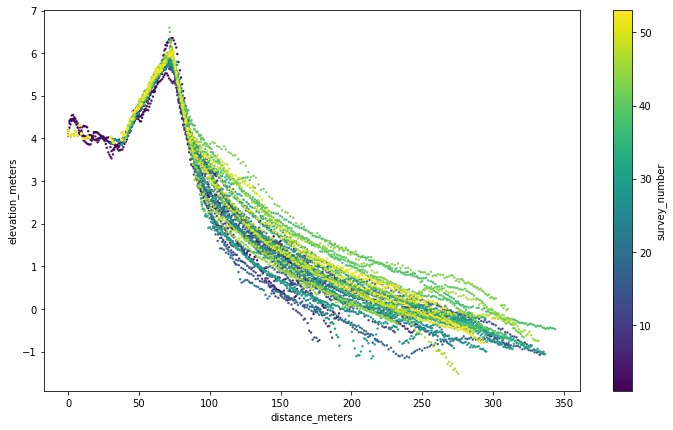

In [7]:
## Make profile plot for one transect colored by time

fig, ax = plt.subplots()

scat = df_merge[(df_merge['transect']=='Bay1')].plot(
    kind='scatter',
    x='distance_meters',
    y='elevation_meters', 
    c='survey_number',
    colormap='viridis',
    figsize=(12,7),
    marker='.',
    linewidths=0.1,
    legend=False,
    ax=ax)

In [8]:
# Make Folium map

import folium
m = folium.Map(location=[df.latitude.mean(),df.longitude.mean()], 
               tiles = 'OpenStreetMap',
              zoom_start=9)
for index, row in df.iterrows():
    trans = row['transect']
    if row['littoralcell'] == 'Bayocean':
        marker = folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=folium.Popup(),
            icon=folium.Icon(color='red'))

    elif row['littoralcell'] == 'Nehalem':
        marker = folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=folium.Popup(),
            icon=folium.Icon(color='green'))
        
    elif row['littoralcell'] == 'Neskowin':
        marker = folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=folium.Popup(),
            icon=folium.Icon(color='blue'))

    else:
        marker = folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=folium.Popup(),
            icon=folium.Icon(color='black'))

    marker.add_to(m)
    
m

In [9]:
from bokeh.embed import file_html
from bokeh.plotting import figure
from bokeh.resources import CDN
from folium import IFrame

# Plot defaults.
tools = "pan,box_zoom,reset,hover"
TOOLTIPS = [
    ("date", "$index"),
    ("elevation_meters", "$y")
    #("date","@ISO_Date")
]
width, height = 750, 250


def make_plot(series):
    p = figure(
        toolbar_location="above",
        width=width,
        height=height,
        tools=tools,
        title=series.transect.unique()[0],
        tooltips=TOOLTIPS,
    )

    
    line = p.scatter(
        x = -1*series.distance_meters,
        y = series.elevation_meters,
        color = series.survey_number,
    )
    return p, line


def make_marker(p, location, fname):
    html = file_html(p, CDN, fname)
    iframe = IFrame(html, width=width + 45, height=height + 80)

    popup = folium.Popup(iframe, max_width=2650)
    icon = folium.Icon(color="green", icon="stats")
    marker = folium.Marker(location=location, popup=popup, icon=icon)
    return marker

In [11]:
import folium

# lon = (bbox[0] + bbox[2]) / 2
# lat = (bbox[1] + bbox[3]) / 2

m = folium.Map(location=[df.latitude.mean(),df.longitude.mean()], 
               tiles = 'OpenStreetMap',
               zoom_start=9)

for index, row in df.iterrows():
    trans = row.transect
    location = row.latitude, row.longitude
    p, _ = make_plot(df_merge[(df_merge['transect']==trans)])
    marker = make_marker(p, location=location, fname=trans)
    marker.add_to(m)

m